## Chronic Kidney Disease
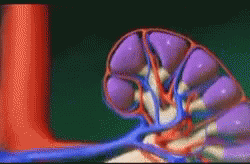

Chronic kidney disease (CKD) is a condition characterized by progressive loss of kidney function over time. Improper diagnosis and treatment of the disease can eventually lead to end-stage renal disease and ultimately lead to the patient’s death. Machine Learning (ML) techniques have acquired an important role in disease prediction and are a useful tool in the field of medical science.

In [1]:
import pandas as pd
import numpy as np
from sklearn import preprocessing
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
plt.style.use('fivethirtyeight')
%matplotlib inline
pd.set_option('display.max_columns', 26)

In [2]:
# reading dataset
CKD_data = pd.read_csv('chronic_kidney_disease.csv')
CKD_data.head()

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wbcc,rbcc,htn,dm,cad,appet,pe,ane,class
0,1,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,121.0,36.0,1.2,NaN,NaN,15.4,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,2,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,NaN,18.0,0.8,NaN,NaN,11.3,38,6000,?,no,\tno,no,good,no,no,ckd
2,3,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,423.0,53.0,1.8,NaN,NaN,9.6,31,7500,?,no,yes,no,poor,no,yes,ckd
3,4,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,117.0,56.0,3.8,111.0,2.5,11.2,32,6700,3.9,yes,no,\tno,poor,yes,yes,ckd
4,5,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,106.0,26.0,1.4,NaN,NaN,11.6,35,7300,4.6,no,no,no,good,no,no,ckd\t


In [3]:
# to check the dataset shape (columns & rows)
CKD_data.shape

(400, 26)

In [4]:
# to remove ID from columns 
CKD_data.drop('id', axis = 1, inplace = True)

In [5]:
# change the dataframe column 
CKD_data.columns = ['age',
                    'blood_pressure',
                    'specific_gravity',
                    'albumin',
                    'sugar',
                    'red_blood_cells',
                    'pus_cell',
                    'pus_cell_clumps',
                    'bacteria',
                    'blood_glucose_random',
                    'blood_urea',
                    'serum_creatinine',
                    'sodium',
                    'potassium',
                    'haemoglobin',
                    'packed_cell_volume',
                    'white_blood_cell_count',
                    'red_blood_cell_count',
                    'hypertension',
                    'diabetes_mellitus',
                    'coronary_artery_disease',
                    'appetite',
                    'peda_edema',
                    'aanemia',
                    'class']

In [6]:
# reading upper five records from dataset
CKD_data.head()

,age,blood_pressure,specific_gravity,albumin,sugar,red_blood_cells,pus_cell,pus_cell_clumps,bacteria,blood_glucose_random,blood_urea,serum_creatinine,sodium,potassium,haemoglobin,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,hypertension,diabetes_mellitus,coronary_artery_disease,appetite,peda_edema,aanemia,class
0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,121.0,36.0,1.2,NaN,NaN,15.4,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,NaN,18.0,0.8,NaN,NaN,11.3,38,6000,?,no,\tno,no,good,no,no,ckd
2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,423.0,53.0,1.8,NaN,NaN,9.6,31,7500,?,no,yes,no,poor,no,yes,ckd
3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,117.0,56.0,3.8,111.0,2.5,11.2,32,6700,3.9,yes,no,\tno,poor,yes,yes,ckd
4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,106.0,26.0,1.4,NaN,NaN,11.6,35,7300,4.6,no,no,no,good,no,no,ckd\t


In [7]:
# describe the dataset record 
CKD_data.describe()

,age,blood_pressure,specific_gravity,albumin,sugar,blood_glucose_random,blood_urea,serum_creatinine,sodium,potassium,haemoglobin
count,391.000000,388.000000,353.000000,354.000000,351.000000,356.000000,381.000000,383.000000,313.000000,312.000000,348.000000
mean,51.483376,76.469072,1.017408,1.016949,0.450142,148.036517,57.425722,3.072454,137.528754,4.627244,12.526437
std,17.169714,13.683637,0.005717,1.352679,1.099191,79.281714,50.503006,5.741126,10.408752,3.193904,2.912587
min,2.000000,50.000000,1.005000,0.000000,0.000000,22.000000,1.500000,0.400000,4.500000,2.500000,3.100000
25%,42.000000,70.000000,1.010000,0.000000,0.000000,99.000000,27.000000,0.900000,135.000000,3.800000,10.300000
50%,55.000000,80.000000,1.020000,0.000000,0.000000,121.000000,42.000000,1.300000,138.000000,4.400000,12.650000
75%,64.500000,80.000000,1.020000,2.000000,0.000000,163.000000,66.000000,2.800000,142.000000,4.900000,15.000000
max,90.000000,180.000000,1.025000,5.000000,5.000000,490.000000,391.000000,76.000000,163.000000,47.000000,17.800000


In [8]:
# information of the dataset
CKD_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 25 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   age                      391 non-null    float64
 1   blood_pressure           388 non-null    float64
 2   specific_gravity         353 non-null    float64
 3   albumin                  354 non-null    float64
 4   sugar                    351 non-null    float64
 5   red_blood_cells          248 non-null    object 
 6   pus_cell                 335 non-null    object 
 7   pus_cell_clumps          396 non-null    object 
 8   bacteria                 396 non-null    object 
 9   blood_glucose_random     356 non-null    float64
 10  blood_urea               381 non-null    float64
 11  serum_creatinine         383 non-null    float64
 12  sodium                   313 non-null    float64
 13  potassium                312 non-null    float64
 14  haemoglobin              3

In [9]:
# to convert the data types of columns (object to float) 
CKD_data['packed_cell_volume'] = pd.to_numeric(CKD_data['packed_cell_volume'], errors = 'coerce')
CKD_data['white_blood_cell_count'] = pd.to_numeric(CKD_data['white_blood_cell_count'], errors = 'coerce')
CKD_data['red_blood_cell_count'] = pd.to_numeric(CKD_data['red_blood_cell_count'], errors = 'coerce')

In [10]:
CKD_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 25 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   age                      391 non-null    float64
 1   blood_pressure           388 non-null    float64
 2   specific_gravity         353 non-null    float64
 3   albumin                  354 non-null    float64
 4   sugar                    351 non-null    float64
 5   red_blood_cells          248 non-null    object 
 6   pus_cell                 335 non-null    object 
 7   pus_cell_clumps          396 non-null    object 
 8   bacteria                 396 non-null    object 
 9   blood_glucose_random     356 non-null    float64
 10  blood_urea               381 non-null    float64
 11  serum_creatinine         383 non-null    float64
 12  sodium                   313 non-null    float64
 13  potassium                312 non-null    float64
 14  haemoglobin              3

In [11]:
# to extract the data whose data type is object
cat_cols = [col for col in CKD_data.columns if CKD_data[col].dtype == 'object']
# to extract the data whose data type is not object
num_cols = [col for col in CKD_data.columns if CKD_data[col].dtype != 'object']

In [12]:
# for loop to display the unique values entered in object data type
for col in cat_cols:
    print(f'{col} has {CKD_data[col].unique()} values\n')

red_blood_cells has [nan 'normal' 'abnormal'] values

pus_cell has ['normal' 'abnormal' nan] values

pus_cell_clumps has ['notpresent' 'present' nan] values

bacteria has ['notpresent' 'present' nan] values

hypertension has ['yes' 'no' nan] values

diabetes_mellitus has ['yes' '\\tno' ' yes' 'no' '\\tyes' nan] values

coronary_artery_disease has ['no' '\\tno' 'yes' nan] values

appetite has ['good' 'poor' nan] values

peda_edema has ['no' 'yes' nan] values

aanemia has ['no' 'yes' nan] values

class has ['ckd' 'ckd\\t' 'notckd'] values



In [13]:
# to replace the different of values from categorical columns to specific values such as (\tno to no, \tyes to yes, )
CKD_data['diabetes_mellitus'].replace(to_replace = {'\tno':'no','\tyes':'yes',' yes':'yes'}, inplace = True)
CKD_data['coronary_artery_disease'].replace(to_replace = {'\\tno':'no'}, inplace = True)
CKD_data['class'].replace(to_replace = {'ckd\\t':'ckd','notckd':'not ckd'}, inplace = True)

In [14]:
# to convert class values to 0 and 1 format such as ('ckd' to 0, and 'not ckd' to 1) 
CKD_data['class'] = CKD_data['class'].map({'ckd':0,'not ckd':1})
# to change the data type of class column (object to numeric)
CKD_data['class'] = pd.to_numeric(CKD_data['class'], errors = 'coerce')

In [15]:
# assigning the 'diabetes_mellitus', 'coronary_artery_disease','class' values to cols
cols = ['diabetes_mellitus', 'coronary_artery_disease','class']
# for loop to display the values from above columns 
for col in cols:
    print(f'{col} has {CKD_data[col].unique()} values\n')

diabetes_mellitus has ['yes' '\\tno' 'no' '\\tyes' nan] values

coronary_artery_disease has ['no' 'yes' nan] values

class has [0 1] values



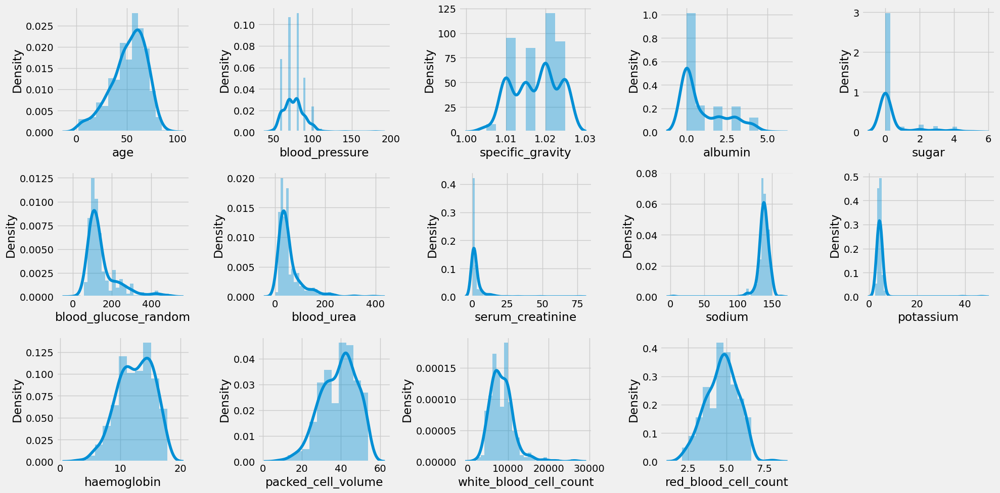

In [16]:
# figure ploting of numerical column
plt.figure(figsize = (20,10))
plot_number = 1

for column in num_cols:
    if plot_number <= 14:
        ax = plt.subplot(3, 5, plot_number)
        sns.distplot(CKD_data[column])
        plt.xlabel(column)
        
    plot_number += 1
plt.tight_layout()
plt.show()

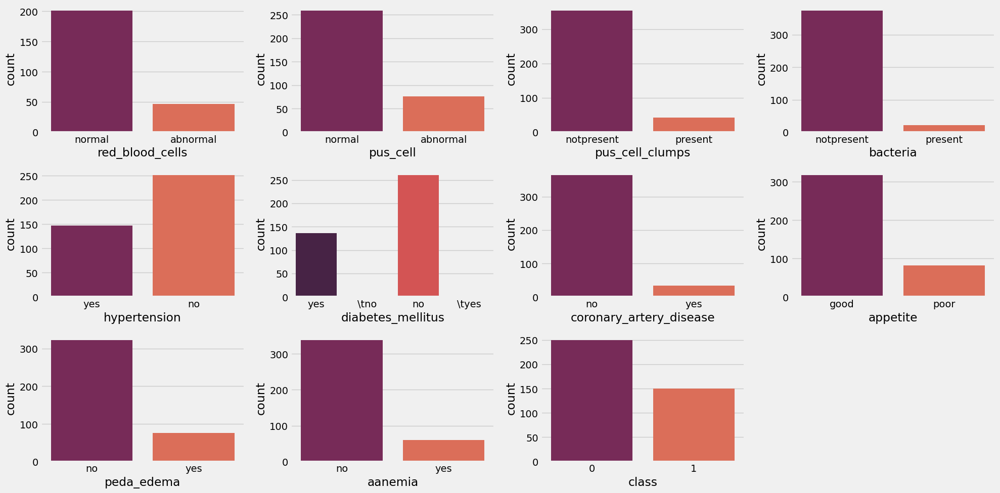

In [17]:
# figure plot of categorized column
plt.figure(figsize = (20, 10))
plot_number = 1

for column in cat_cols:
    if plot_number <= 11:
        ax = plt.subplot(3, 4, plot_number)
        sns.countplot(CKD_data[column], palette = 'rocket')
        plt.xlabel(column)
        
    plot_number += 1
plt.tight_layout()
plt.show()

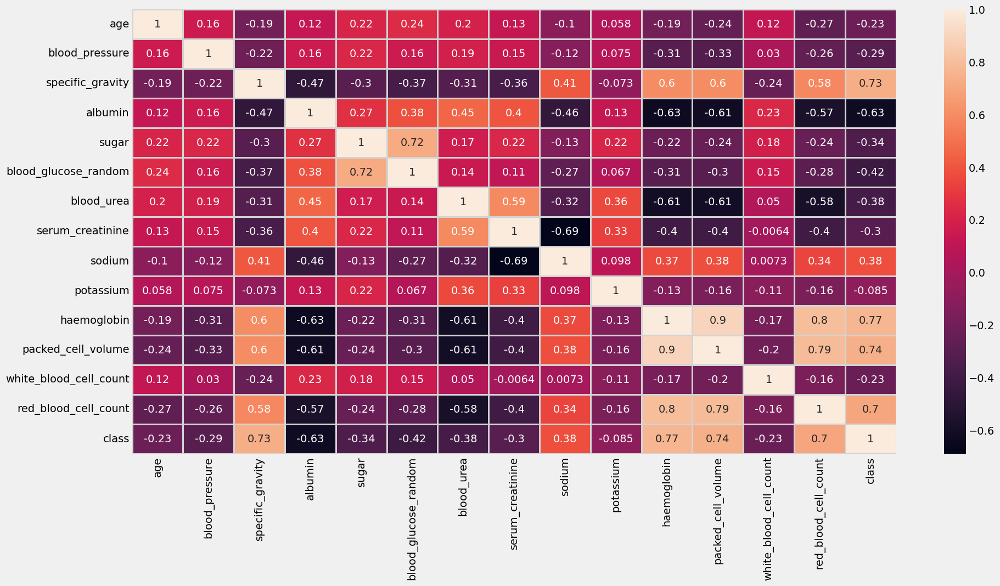

In [18]:
plt.figure(figsize = (20,10))

sns.heatmap(CKD_data.corr(), annot = True, linewidths = 2,
           linecolor = 'lightgrey')
plt.show()

In [19]:
CKD_data.columns

Index(['age', 'blood_pressure', 'specific_gravity', 'albumin', 'sugar',
       'red_blood_cells', 'pus_cell', 'pus_cell_clumps', 'bacteria',
       'blood_glucose_random', 'blood_urea', 'serum_creatinine', 'sodium',
       'potassium', 'haemoglobin', 'packed_cell_volume',
       'white_blood_cell_count', 'red_blood_cell_count', 'hypertension',
       'diabetes_mellitus', 'coronary_artery_disease', 'appetite',
       'peda_edema', 'aanemia', 'class'],
      dtype='object')

In [20]:
# define violin function
def violin(col):
    fig = px.violin(CKD_data, y=col, x='class', color = 'class',
                    box=True, template='plotly_dark')
    return fig.show()
# define kde function
def kde(col):
    grid = sns.FacetGrid(CKD_data, hue = 'class', height = 6, aspect=2)
    grid.map(sns.kdeplot, col)
    grid.add_legend()
# define scatter function     
def scatter(col1, col2):
    fig = px.scatter(CKD_data, x=col1, y=col2, color='class', template = 'plotly_dark')
    return fig.show()

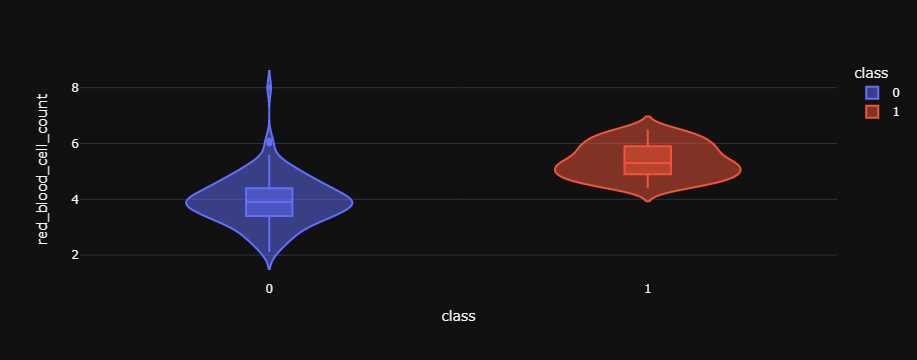

In [21]:
violin('red_blood_cell_count')

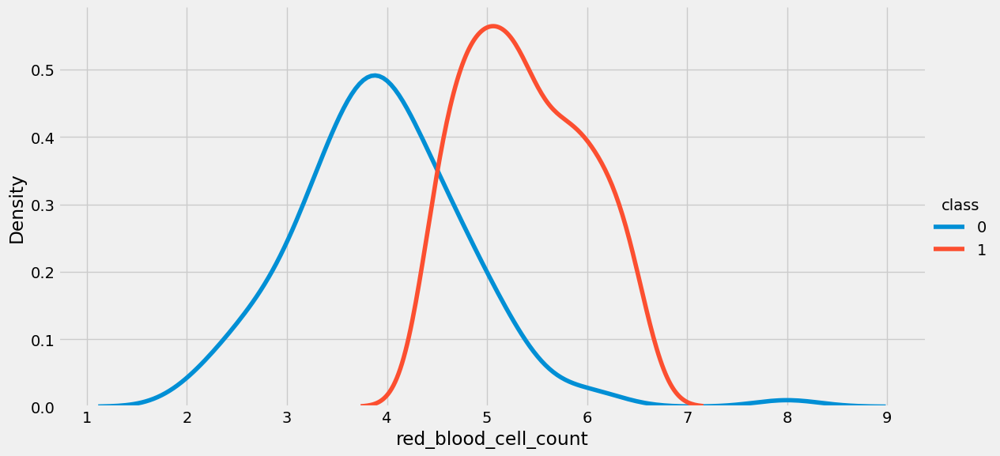

In [22]:
kde('red_blood_cell_count')

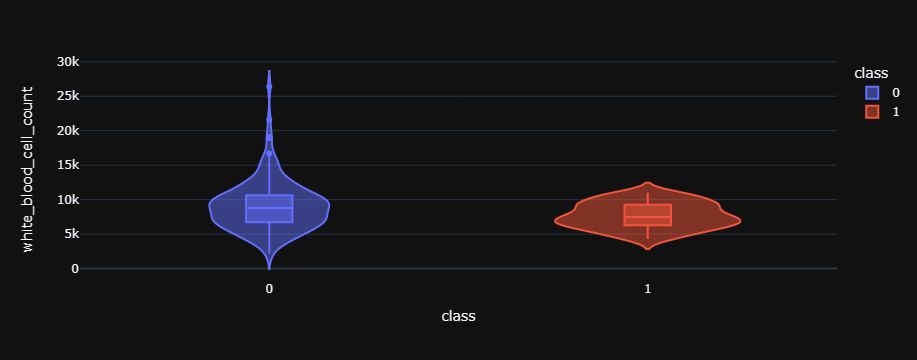

In [23]:
violin('white_blood_cell_count')

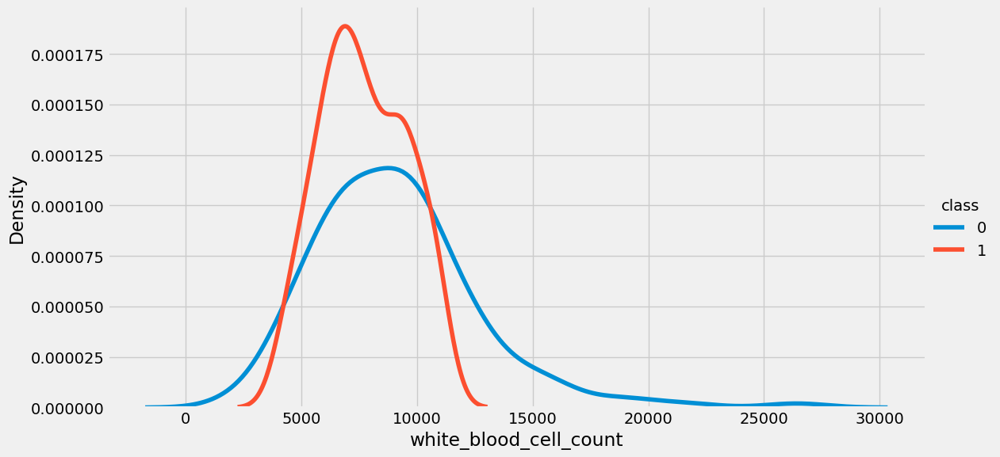

In [24]:
kde('white_blood_cell_count')

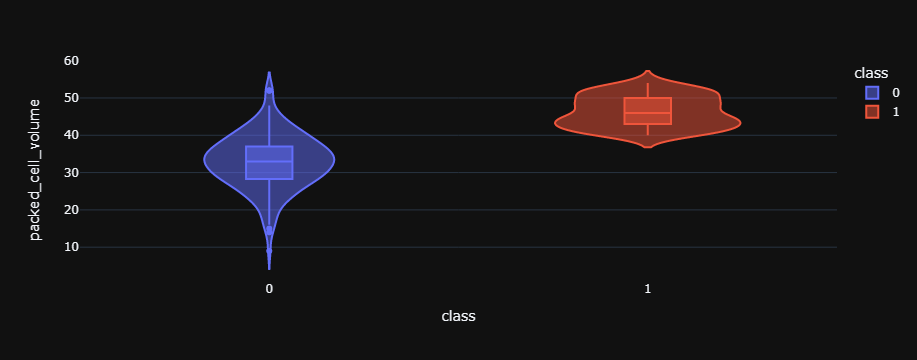

In [25]:
violin('packed_cell_volume')

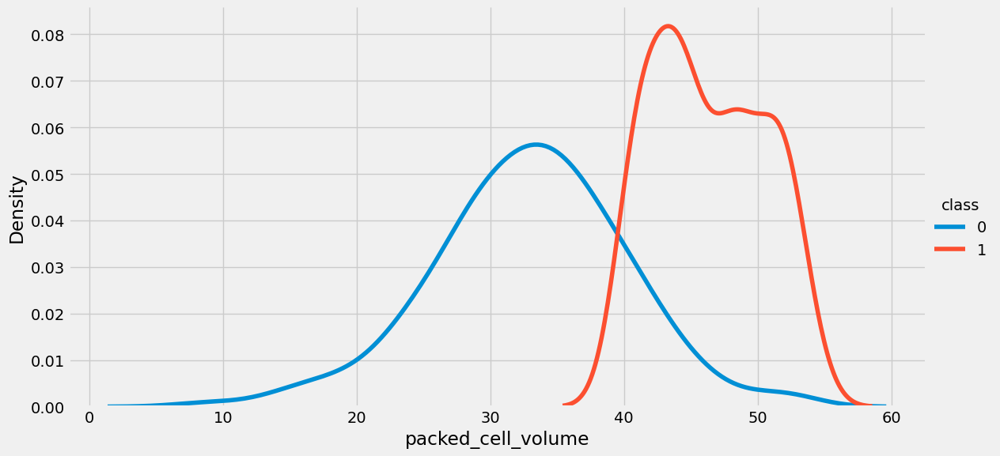

In [26]:
kde('packed_cell_volume')

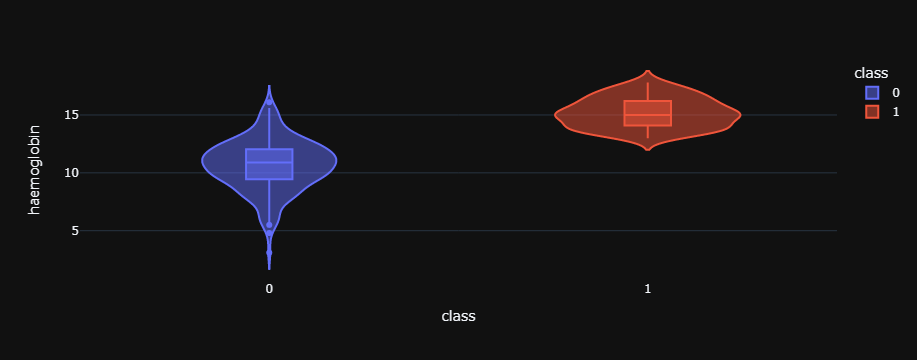

In [27]:
violin('haemoglobin')

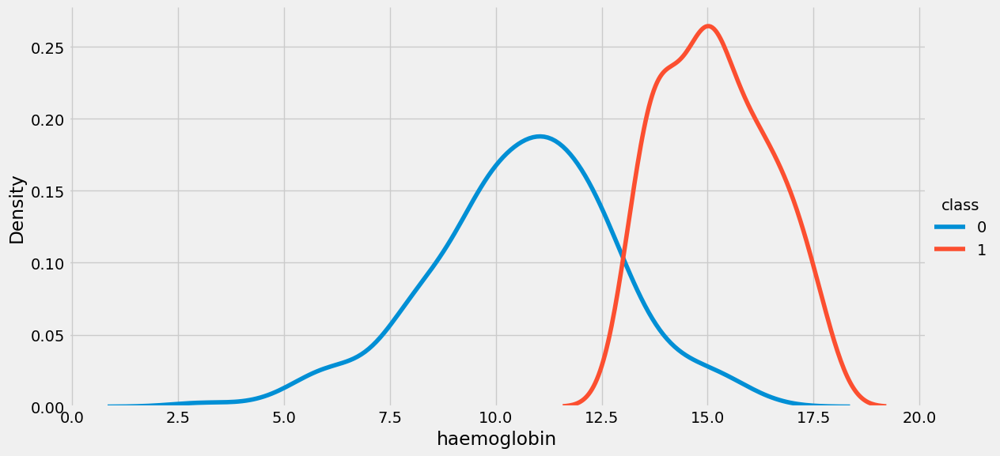

In [28]:
kde('haemoglobin')

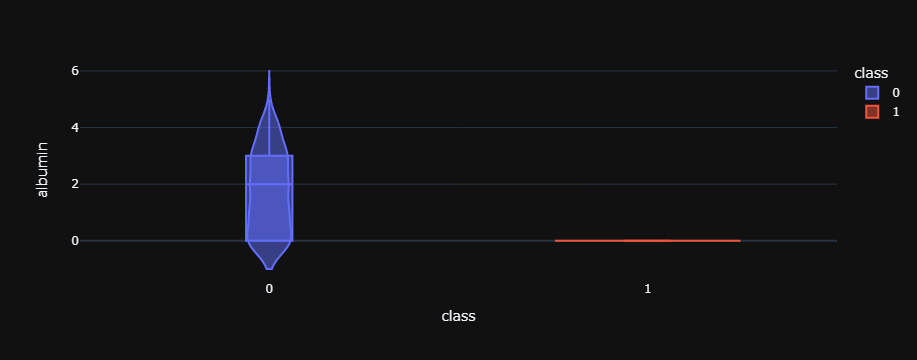

In [29]:
violin('albumin')

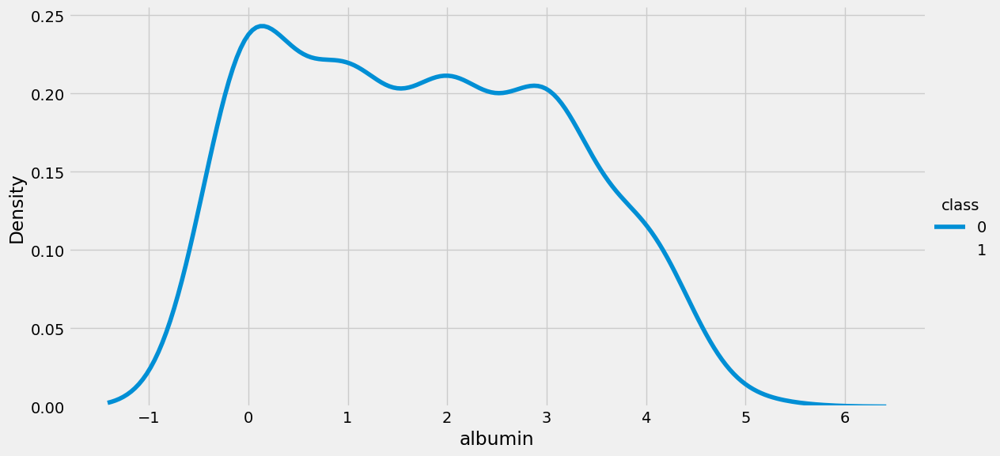

In [30]:
kde('albumin')

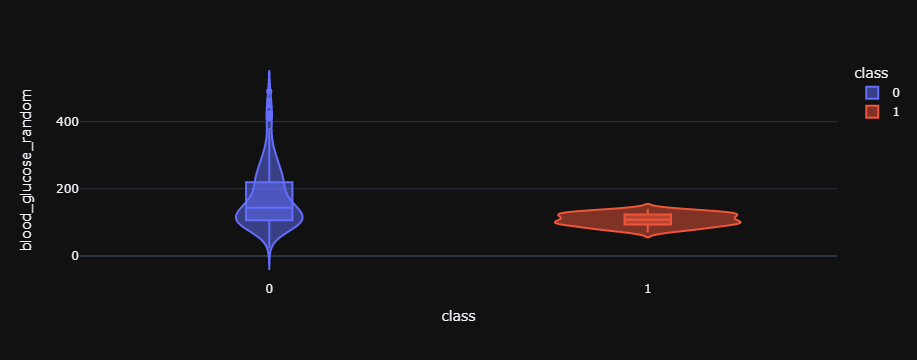

In [31]:
violin('blood_glucose_random')

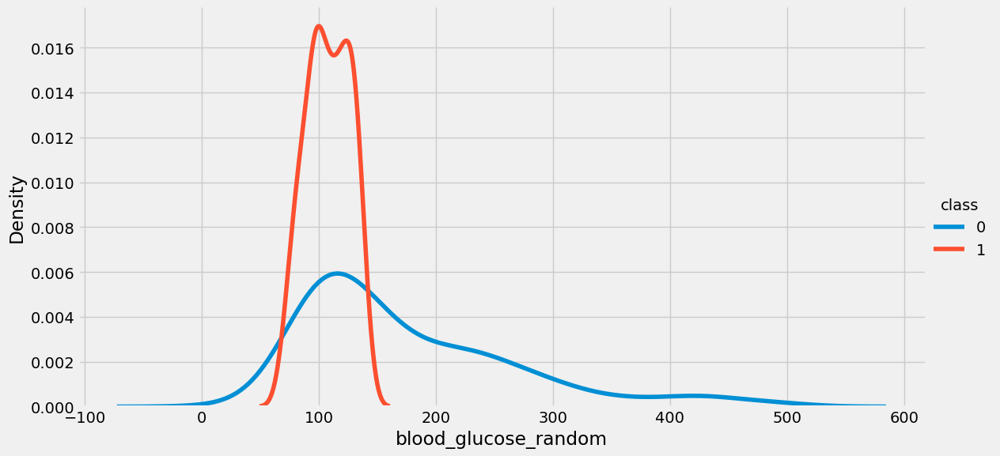

In [32]:
kde('blood_glucose_random')

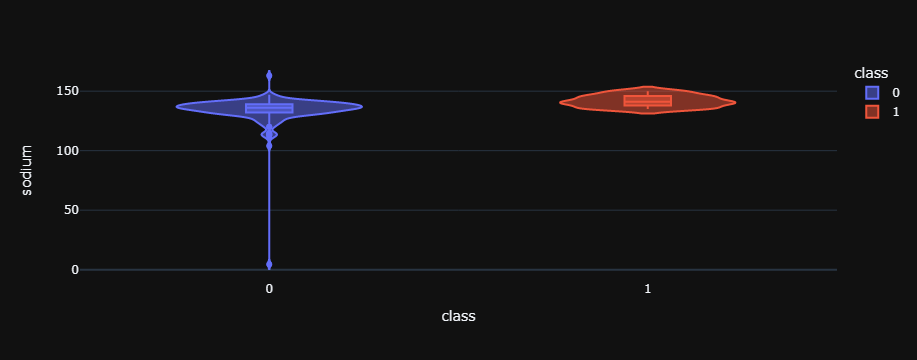

In [33]:
violin('sodium')

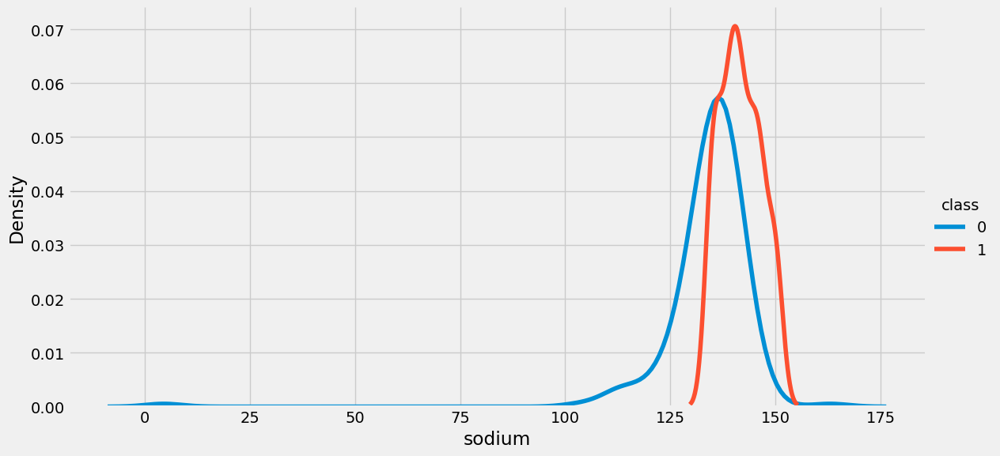

In [34]:
kde('sodium')

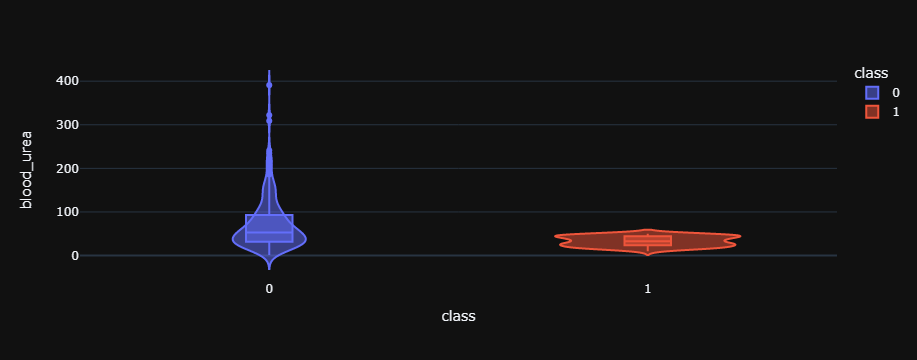

In [35]:
violin('blood_urea')

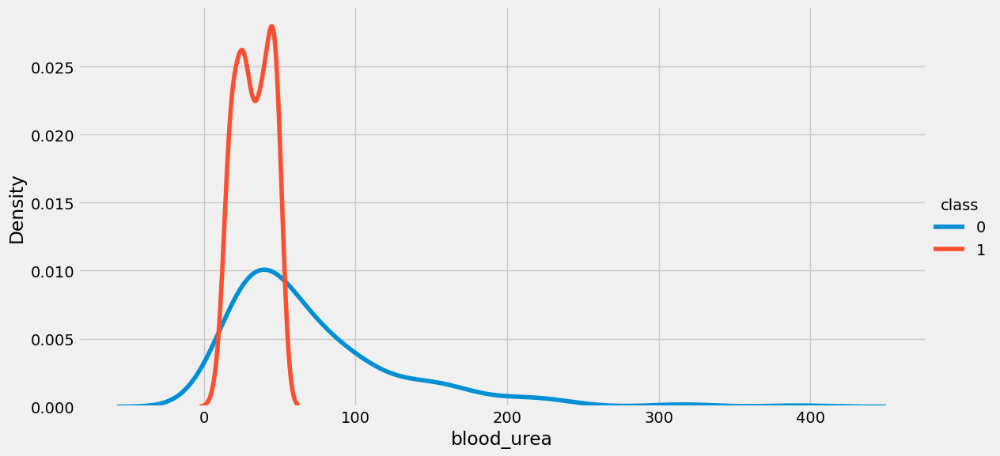

In [36]:
kde('blood_urea')

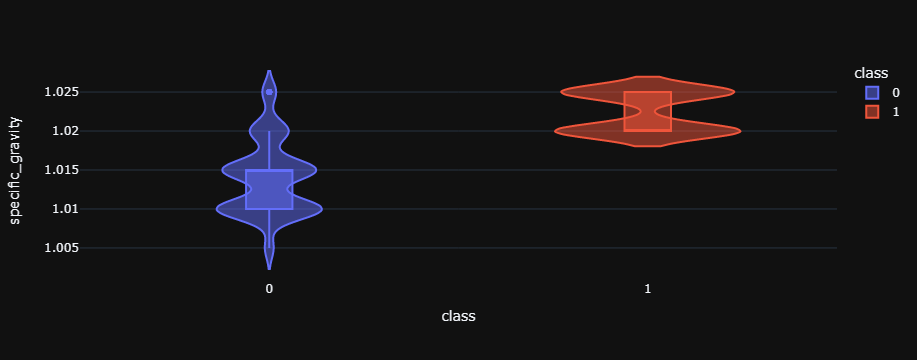

In [37]:
violin('specific_gravity')

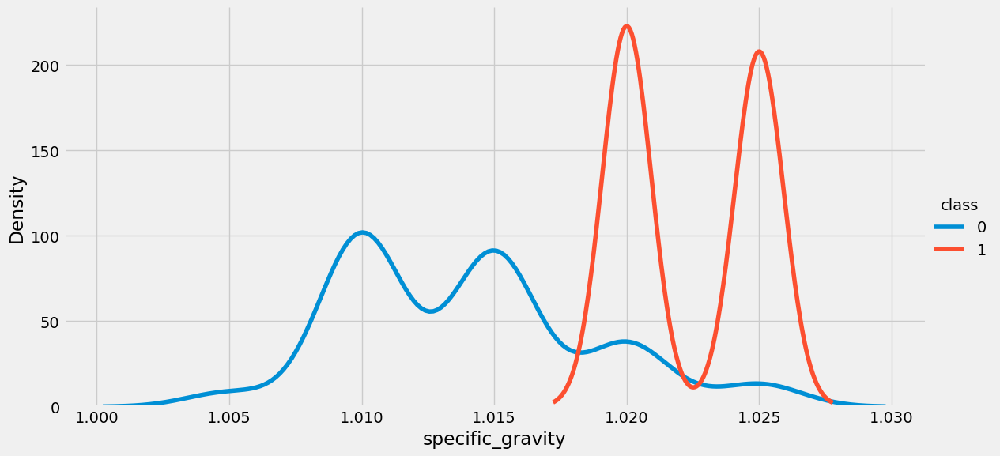

In [38]:
kde('specific_gravity')

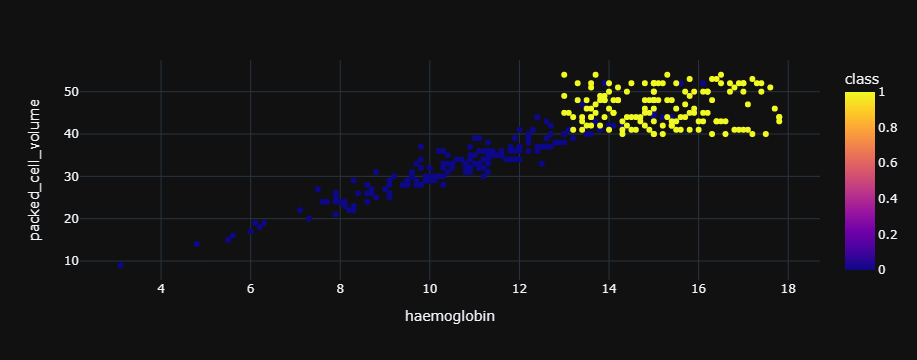

In [39]:
scatter('haemoglobin', 'packed_cell_volume')

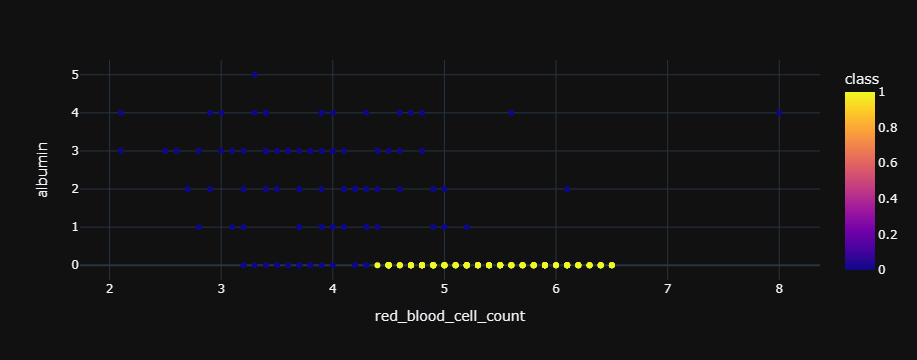

In [40]:
scatter('red_blood_cell_count','albumin')

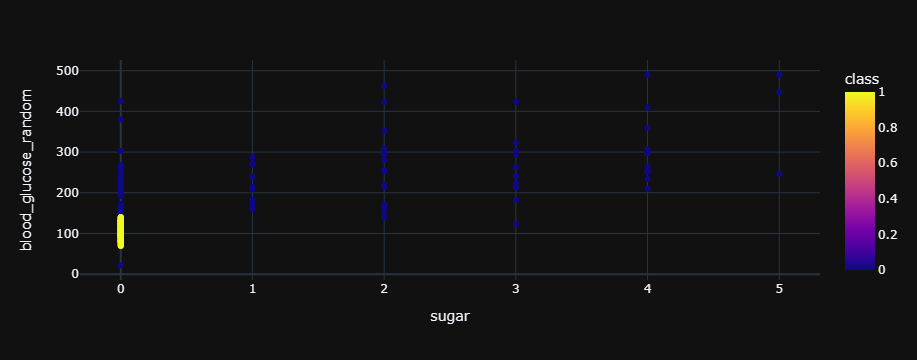

In [41]:
scatter('sugar', 'blood_glucose_random')

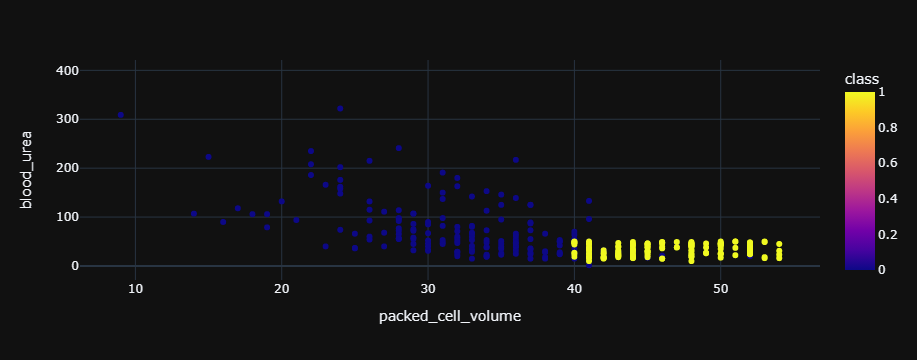

In [42]:
scatter('packed_cell_volume', 'blood_urea')

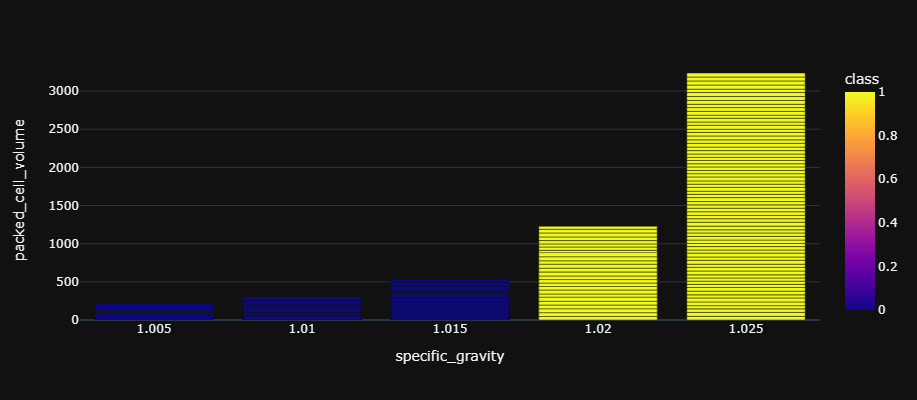

In [43]:
# bar graph 
px.bar(CKD_data, x='specific_gravity', y='packed_cell_volume',
      color = 'class', barmode = 'group', template = 'plotly_dark',
      height = 400)

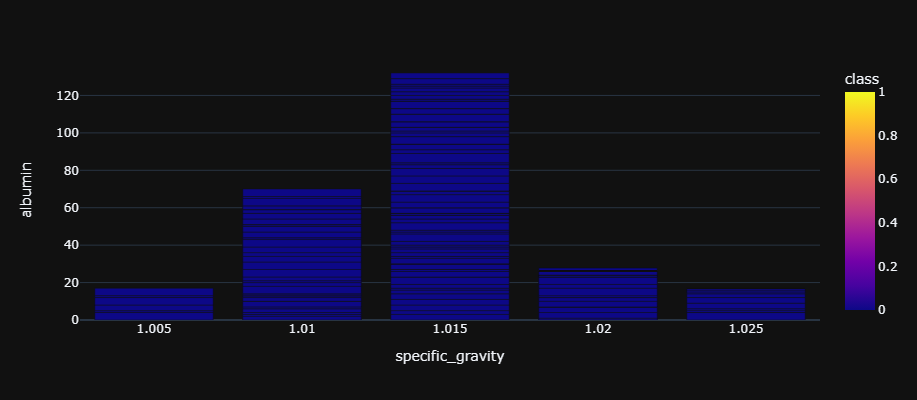

In [44]:
px.bar(CKD_data, x='specific_gravity', y='albumin', color = 'class',
      barmode='group', template = 'plotly_dark', height = 400)

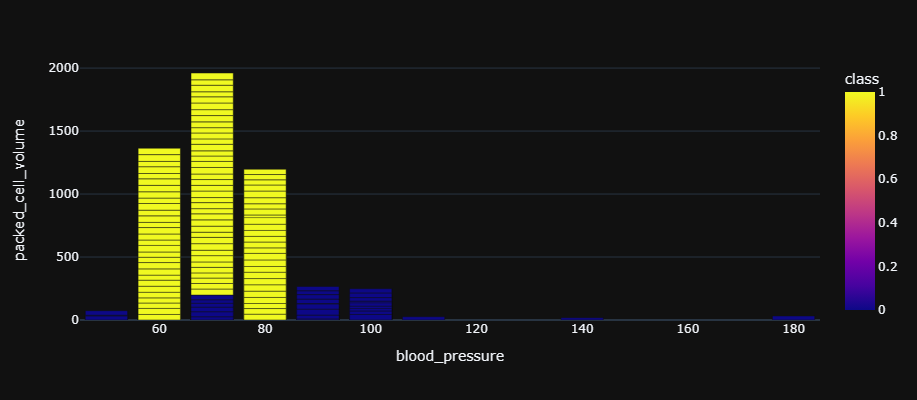

In [45]:
px.bar(CKD_data, x='blood_pressure', y='packed_cell_volume',
      color='class', barmode='group', template = 'plotly_dark',
      height= 400)

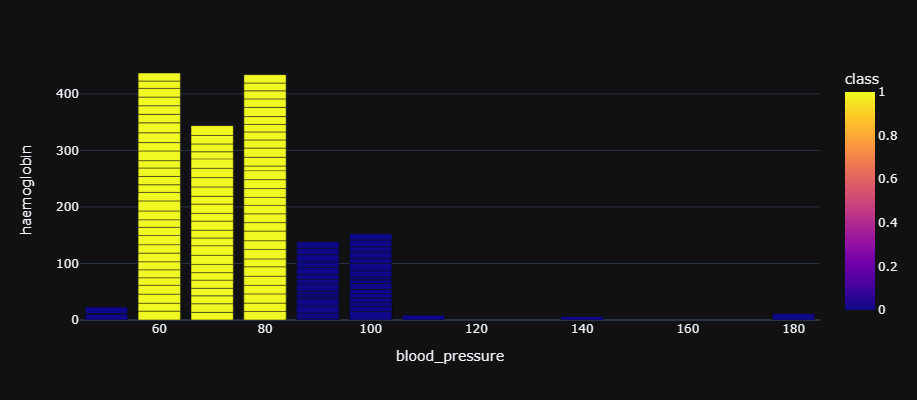

In [46]:
px.bar(CKD_data, x='blood_pressure', y='haemoglobin',
       color='class',barmode='group', 
       template = 'plotly_dark',height= 400)

In [47]:
# detect the missing values, sum and sort values
CKD_data.isna().sum().sort_values(ascending=False)


red_blood_cells            152
red_blood_cell_count       131
white_blood_cell_count     106
potassium                   88
sodium                      87
packed_cell_volume          71
pus_cell                    65
haemoglobin                 52
sugar                       49
specific_gravity            47
albumin                     46
blood_glucose_random        44
blood_urea                  19
serum_creatinine            17
blood_pressure              12
age                          9
bacteria                     4
pus_cell_clumps              4
hypertension                 2
diabetes_mellitus            2
coronary_artery_disease      2
appetite                     1
peda_edema                   1
aanemia                      1
class                        0
dtype: int64

In [48]:
# detect the null values from numerical columns and display sum of counts from each column
CKD_data[num_cols].isnull().sum()

age                         9
blood_pressure             12
specific_gravity           47
albumin                    46
sugar                      49
blood_glucose_random       44
blood_urea                 19
serum_creatinine           17
sodium                     87
potassium                  88
haemoglobin                52
packed_cell_volume         71
white_blood_cell_count    106
red_blood_cell_count      131
dtype: int64

In [49]:
# detect the null values from category columns and display sum of counts from each column
CKD_data[cat_cols].isnull().sum()


red_blood_cells            152
pus_cell                    65
pus_cell_clumps              4
bacteria                     4
hypertension                 2
diabetes_mellitus            2
coronary_artery_disease      2
appetite                     1
peda_edema                   1
aanemia                      1
class                        0
dtype: int64

In [50]:
def random_value_imputation(feature):
    random_sample = CKD_data[feature].dropna().sample(
    CKD_data[feature].isna().sum())
    random_sample.index = CKD_data[CKD_data[feature].isnull()].index
    CKD_data.loc[CKD_data[feature].isnull(),feature] = random_sample

def impute_mode(feature):
    mode = CKD_data[feature].mode()[0]
    CKD_data[feature] = CKD_data[feature].fillna(mode)
                                   

In [51]:
for col in num_cols:
    random_value_imputation(col)

In [52]:
# to display the sum of counts of null values(if any) from numerical columns 
CKD_data[num_cols].isnull().sum()

age                       0
blood_pressure            0
specific_gravity          0
albumin                   0
sugar                     0
blood_glucose_random      0
blood_urea                0
serum_creatinine          0
sodium                    0
potassium                 0
haemoglobin               0
packed_cell_volume        0
white_blood_cell_count    0
red_blood_cell_count      0
dtype: int64

In [53]:
random_value_imputation('red_blood_cells')
random_value_imputation('pus_cell')

for col in cat_cols:
    impute_mode(col)

In [54]:
# to display the sum of counts of null values(if any) from category columns
CKD_data[cat_cols].isnull().sum()

red_blood_cells            0
pus_cell                   0
pus_cell_clumps            0
bacteria                   0
hypertension               0
diabetes_mellitus          0
coronary_artery_disease    0
appetite                   0
peda_edema                 0
aanemia                    0
class                      0
dtype: int64

In [55]:
# for loop to define the category column value  
for col in cat_cols:
    print(f'{col} has {CKD_data[col].nunique()} categories\n')

red_blood_cells has 2 categories

pus_cell has 2 categories

pus_cell_clumps has 2 categories

bacteria has 2 categories

hypertension has 2 categories

diabetes_mellitus has 4 categories

coronary_artery_disease has 2 categories

appetite has 2 categories

peda_edema has 2 categories

aanemia has 2 categories

class has 2 categories



In [56]:
from sklearn.preprocessing import LabelEncoder

le  =LabelEncoder()
for col in cat_cols:
    CKD_data[col] = le.fit_transform(CKD_data[col])

In [57]:
CKD_data.head()

,age,blood_pressure,specific_gravity,albumin,sugar,red_blood_cells,pus_cell,pus_cell_clumps,bacteria,blood_glucose_random,blood_urea,serum_creatinine,sodium,potassium,haemoglobin,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,hypertension,diabetes_mellitus,coronary_artery_disease,appetite,peda_edema,aanemia,class
0,48.0,80.0,1.020,1.0,0.0,0,1,0,0,121.0,36.0,1.2,145.0,3.9,15.4,44.0,7800.0,5.2,1,3,0,0,0,0,0
1,7.0,50.0,1.020,4.0,0.0,0,1,0,0,113.0,18.0,0.8,150.0,3.9,11.3,38.0,6000.0,4.9,0,0,0,0,0,0,0
2,62.0,80.0,1.010,2.0,3.0,1,1,0,0,423.0,53.0,1.8,142.0,5.0,9.6,31.0,7500.0,5.5,0,3,0,1,0,1,0
3,48.0,70.0,1.005,4.0,0.0,1,0,1,0,117.0,56.0,3.8,111.0,2.5,11.2,32.0,6700.0,3.9,1,2,0,1,1,1,0
4,51.0,80.0,1.010,2.0,0.0,1,1,0,0,106.0,26.0,1.4,141.0,4.1,11.6,35.0,7300.0,4.6,0,2,0,0,0,0,0


In [58]:
CKD_data.dtypes

age                        float64
blood_pressure             float64
specific_gravity           float64
albumin                    float64
sugar                      float64
red_blood_cells              int32
pus_cell                     int32
pus_cell_clumps              int32
bacteria                     int32
blood_glucose_random       float64
blood_urea                 float64
serum_creatinine           float64
sodium                     float64
potassium                  float64
haemoglobin                float64
packed_cell_volume         float64
white_blood_cell_count     float64
red_blood_cell_count       float64
hypertension                 int32
diabetes_mellitus            int32
coronary_artery_disease      int32
appetite                     int32
peda_edema                   int32
aanemia                      int32
class                        int64
dtype: object

In [59]:
# assigning the dataframe of columns to ind_col if col is not class 
ind_col = [col for col in CKD_data.columns if col != 'class']
# assigning the dataframe of columns to dep_col where col is class 
dep_col = 'class'
# assigning the dataframe ind_col to X
X = CKD_data[ind_col]
# assigning the dataframe dep_col to Y
Y = CKD_data[dep_col]

In [60]:
# splitting the dataframe
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(X,Y,test_size = 0.30, random_state = 0)

# Implementing K-Nearest Neighbors Algorithm

In [61]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

knn = KNeighborsClassifier()
knn.fit(x_train, y_train)

knn_acc = accuracy_score(y_test, knn.predict(x_test))
print(f'Training Accuracy of KNN is {accuracy_score(y_train,knn.predict(x_train))}')
print(f'Test Accuracy of KNN is {knn_acc}\n')
print(f'Confusion Matrix :- \n {confusion_matrix(y_test, knn.predict(x_test))}\n')
print(f'Classification Report :-\n{classification_report(y_test, knn.predict(x_test))}')

Training Accuracy of KNN is 0.7785714285714286
Test Accuracy of KNN is 0.6583333333333333

Confusion Matrix :- 
 [[42 30]
 [11 37]]

Classification Report :-
              precision    recall  f1-score   support

           0       0.79      0.58      0.67        72
           1       0.55      0.77      0.64        48

    accuracy                           0.66       120
   macro avg       0.67      0.68      0.66       120
weighted avg       0.70      0.66      0.66       120



# Decision Tree Algorithm implementation

In [74]:
from sklearn.tree import DecisionTreeClassifier

dtc = DecisionTreeClassifier()
dtc.fit(x_train, y_train)


dtc_acc1 = accuracy_score(y_test, dtc.predict(x_test))
print(f'Training Accuracy of Decision Tree Classifier is {accuracy_score(y_train, dtc.predict(x_train))}')
print(f'Test Accuracy of Decision Tree Classifier is {dtc_acc}\n ')
print(f'Confusion Matrix :- \n {confusion_matrix(y_test, dtc.predict(x_test))}\n')
print(f'Classification Report :-\n{classification_report(y_test, dtc.predict(x_test))}')

Training Accuracy of Decision Tree Classifier is 1.0
Test Accuracy of Decision Tree Classifier is 0.9583333333333334
 
Confusion Matrix :- 
 [[71  1]
 [ 2 46]]

Classification Report :-
              precision    recall  f1-score   support

           0       0.97      0.99      0.98        72
           1       0.98      0.96      0.97        48

    accuracy                           0.97       120
   macro avg       0.98      0.97      0.97       120
weighted avg       0.98      0.97      0.97       120



# GridSearchCV Technique

In [63]:
from sklearn.model_selection import GridSearchCV
grid_param = {'criterion':['gini','entropy'],
             'max_depth': [3,5,7,10],
             'splitter' : ['best','random'],
             'min_samples_leaf':[1,2,3,5,7],
             'min_samples_split':[1,2,3,5,7],
             'max_features':['auto','sqrt','log2']
             }
grid_search_dtc = GridSearchCV(dtc, grid_param, cv = 5, verbose = 1)
grid_search_dtc.fit(x_train, y_train)

Fitting 5 folds for each of 1200 candidates, totalling 6000 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [3, 5, 7, 10],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 3, 5, 7],
                         'min_samples_split': [1, 2, 3, 5, 7],
                         'splitter': ['best', 'random']},
             verbose=1)

In [64]:
print(grid_search_dtc.best_params_)
print(grid_search_dtc.best_score_)

{'criterion': 'entropy', 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 3, 'min_samples_split': 3, 'splitter': 'best'}
0.9857142857142858


In [65]:
dtc = grid_search_dtc.best_estimator_

dtc_acc = accuracy_score(y_test, dtc.predict(x_test))
print(f'Training Accuracy of Decision Tree Classifier is {accuracy_score(y_train, dtc.predict(x_train))}')
print(f'Test Accuracy of Decision Tree Classifier is {dtc_acc}\n ')
print(f'Confusion Matrix :- \n {confusion_matrix(y_test, dtc.predict(x_test))}\n')
print(f'Classification Report :-\n{classification_report(y_test, dtc.predict(x_test))}')

Training Accuracy of Decision Tree Classifier is 0.9785714285714285
Test Accuracy of Decision Tree Classifier is 0.9583333333333334
 
Confusion Matrix :- 
 [[70  2]
 [ 3 45]]

Classification Report :-
              precision    recall  f1-score   support

           0       0.96      0.97      0.97        72
           1       0.96      0.94      0.95        48

    accuracy                           0.96       120
   macro avg       0.96      0.95      0.96       120
weighted avg       0.96      0.96      0.96       120



# Random Forest Algorithm Implementation

In [66]:
from sklearn.ensemble import RandomForestClassifier

rd_clf = RandomForestClassifier(criterion = 'entropy', max_depth = 11,
                               max_features = 'auto', min_samples_leaf = 2,
                               min_samples_split = 3, n_estimators = 130)
rd_clf.fit(x_train, y_train)

rd_clf_acc = accuracy_score(y_test, rd_clf.predict(x_test))

print(f'Training Accuracy of Random Forest Classifier is {accuracy_score(y_train, rd_clf.predict(x_train))}')
print(f'Test Accuracy of Random Forest Classifier is {rd_clf_acc}\n')
print(f'Confusion Matrix :- \n{confusion_matrix(y_test, rd_clf.predict(x_test))}\n')
print(f'Classification Report :- \n{classification_report(y_test, rd_clf.predict(x_test))}')


Training Accuracy of Random Forest Classifier is 0.9964285714285714
Test Accuracy of Random Forest Classifier is 0.975

Confusion Matrix :- 
[[71  1]
 [ 2 46]]

Classification Report :- 
              precision    recall  f1-score   support

           0       0.97      0.99      0.98        72
           1       0.98      0.96      0.97        48

    accuracy                           0.97       120
   macro avg       0.98      0.97      0.97       120
weighted avg       0.98      0.97      0.97       120



# AdaBoost Algorithm (AdaBosstClassifier) Implementation

In [67]:
from sklearn.ensemble import AdaBoostClassifier

ada = AdaBoostClassifier(base_estimator = dtc)
ada.fit(x_train, y_train)

ada_acc = accuracy_score(y_test, ada.predict(x_test))

print(f'Training Accuracy of Ada Boost Classifier is {accuracy_score(y_train, ada.predict(x_train))}')
print(f'Test Accuracy of Ada Boost Classifier is {ada_acc}\n')
print(f'Confusion Matrix :- {confusion_matrix(y_test, ada.predict(x_test))}\n')
print(f'Classification Report :- \n{classification_report(y_test, ada.predict(x_test))}')

Training Accuracy of Ada Boost Classifier is 1.0
Test Accuracy of Ada Boost Classifier is 0.9916666666666667

Confusion Matrix :- [[72  0]
 [ 1 47]]

Classification Report :- 
              precision    recall  f1-score   support

           0       0.99      1.00      0.99        72
           1       1.00      0.98      0.99        48

    accuracy                           0.99       120
   macro avg       0.99      0.99      0.99       120
weighted avg       0.99      0.99      0.99       120



# Gradient Boosting Algorithm Implementation

In [68]:
from sklearn.ensemble import GradientBoostingClassifier

gb = GradientBoostingClassifier()
gb.fit(x_train, y_train)

gb_acc = accuracy_score(y_test, gb.predict(x_test))

print(f'Training Accuracy of Gradient Boosting Classifier is{accuracy_score(y_train, gb.predict(x_train))}')
print(f'Test Accuracy of Gradient Boosting Classifier is{gb_acc}\n')
print(f'Confusion Matrix :- \n{confusion_matrix(y_test, gb.predict(x_test))}\n')
print(f'Classification Matrix :- \n{classification_report(y_test, gb.predict(x_test))}')

Training Accuracy of Gradient Boosting Classifier is1.0
Test Accuracy of Gradient Boosting Classifier is0.975

Confusion Matrix :- 
[[71  1]
 [ 2 46]]

Classification Matrix :- 
              precision    recall  f1-score   support

           0       0.97      0.99      0.98        72
           1       0.98      0.96      0.97        48

    accuracy                           0.97       120
   macro avg       0.98      0.97      0.97       120
weighted avg       0.98      0.97      0.97       120



# XGBoost Algorithm Implementation

In [69]:
from xgboost import XGBClassifier

xgb = XGBClassifier(objective = 'binary:logistic', learning_rate = 0.5, max_depth = 5, n_estimators = 150)
xgb.fit(x_train, y_train)

xgb_acc = accuracy_score(y_test, xgb.predict(x_test))

print(f'Training Accuracy of XGBoost is {accuracy_score(y_train, xgb.predict(x_train))}')
print(f'Test Accuracy of XGBoost is {xgb_acc}\n')
print(f'Confusion Matrix :- \n {confusion_matrix(y_test, xgb.predict(x_test))}\n')
print(f'Classification Report :- \n {classification_report(y_test, xgb.predict(x_test))}')

Training Accuracy of XGBoost is 1.0
Test Accuracy of XGBoost is 0.9666666666666667

Confusion Matrix :- 
 [[71  1]
 [ 3 45]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.96      0.99      0.97        72
           1       0.98      0.94      0.96        48

    accuracy                           0.97       120
   macro avg       0.97      0.96      0.97       120
weighted avg       0.97      0.97      0.97       120



# CatBoost Algorithm Implementation

In [70]:
from catboost import CatBoostClassifier

cat = CatBoostClassifier(iterations = 10)
cat.fit(x_train, y_train)

cat_acc = accuracy_score(y_test, cat.predict(x_test))

print(f'Training Accuracy of Cat Boost Classifier is {accuracy_score(y_train, cat.predict(x_train))}')
print(f'Test Accuracy of Cat Boost Classifier is {cat_acc}\n')
print(f'Confusion Matrix :- \n {confusion_matrix(y_test, cat.predict(x_test))}\n')
print(f'Classification Report :- \n {classification_report(y_test, cat.predict(x_test))}')

Learning rate set to 0.408198
0:	learn: 0.2200868	total: 155ms	remaining: 1.39s
1:	learn: 0.1350709	total: 166ms	remaining: 665ms
2:	learn: 0.0877080	total: 179ms	remaining: 417ms
3:	learn: 0.0673817	total: 193ms	remaining: 290ms
4:	learn: 0.0477799	total: 213ms	remaining: 213ms
5:	learn: 0.0378986	total: 233ms	remaining: 156ms
6:	learn: 0.0298153	total: 248ms	remaining: 106ms
7:	learn: 0.0229393	total: 262ms	remaining: 65.5ms
8:	learn: 0.0203346	total: 280ms	remaining: 31.1ms
9:	learn: 0.0170534	total: 297ms	remaining: 0us
Training Accuracy of Cat Boost Classifier is 1.0
Test Accuracy of Cat Boost Classifier is 0.9916666666666667

Confusion Matrix :- 
 [[71  1]
 [ 0 48]]

Classification Report :- 
               precision    recall  f1-score   support

           0       1.00      0.99      0.99        72
           1       0.98      1.00      0.99        48

    accuracy                           0.99       120
   macro avg       0.99      0.99      0.99       120
weighted avg       

# LGBM Implementation


In [71]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier(learning_rate = 1)
lgbm.fit(x_train, y_train)

lgbm_acc = accuracy_score(y_test, lgbm.predict(x_test))

print(f'Training Accuracy of LGBM Classifier is {accuracy_score(y_train, lgbm.predict(x_train))}')
print(f'Test Accuracy of LGBM Classifier is {lgbm_acc}\n')
print(f'Confusion Matrix :- \n {confusion_matrix(y_test, lgbm.predict(x_test))}\n')
print(f'Classification Report :- \n {classification_report(y_test, lgbm.predict(x_test))}\n')

Training Accuracy of LGBM Classifier is 1.0
Test Accuracy of LGBM Classifier is 0.975

Confusion Matrix :- 
 [[72  0]
 [ 3 45]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.96      1.00      0.98        72
           1       1.00      0.94      0.97        48

    accuracy                           0.97       120
   macro avg       0.98      0.97      0.97       120
weighted avg       0.98      0.97      0.97       120




# Table of Comparision of different models
Table of comparision of different models and sorting by the best accurate model. 

In [75]:

models = pd.DataFrame({'Model': 
                       ['KNN', 'Decision Tree Classifier',
                        'Random Forest Classifier', 'Ada Boost Classifier',
                        'XGBoost', 'Cat Boost', 'LGBM Classifier'],
                       'Score': [knn_acc, dtc_acc1, rd_clf_acc, ada_acc,
                                 xgb_acc, cat_acc, lgbm_acc]})

models.sort_values(by = 'Score', ascending = False)

,Model,Score
3,Ada Boost Classifier,0.991667
5,Cat Boost,0.991667
1,Decision Tree Classifier,0.975000
2,Random Forest Classifier,0.975000
6,LGBM Classifier,0.975000
4,XGBoost,0.966667
0,KNN,0.658333


# Graphic representation of different models
Representation the best acquire result of different models and showing them with Bar graph.

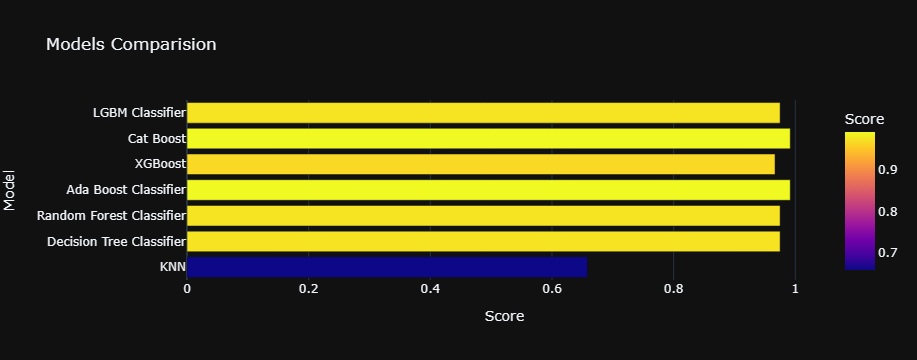

In [76]:
px.bar(data_frame = models, x = 'Score', y = 'Model', color = 'Score',
      template = 'plotly_dark', title = 'Models Comparision')

# Conclusion
After implementing different models on the used dataset, we find that the best model to acquire the result is CatBoost Classifier and Ada Boost Classifier , because we are getting the maximum score by yellow color of bar, and mouse over shows numerical score of model which is best than the other.